### QARTOD Example: OA1 mooring - Seawater Temperature ###

This notebook demonstrates how to run some basic QARTOD tests on real data from MBARI's OA1 mooring. This data was downloaded and a small subset is stored in this repository in the `data` folder.

The data is loaded into an xarray dataset and converted into a pandas dataframe for ease of accessing.

The tests run are:
- Gross Range Test
- Spike Test
- Flat Line Test
- Rate Change Test
    
Test parameters used in this example are not to be taken seriously.

In [1]:
from ioos_qc.config import QcConfig
from ioos_qc import qartod
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime

from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_notebook, save
from bokeh.embed import file_html
from bokeh.resources import CDN
from bokeh.io import output_file, show
output_notebook()

Loading BokehJS ...

In [7]:
def plot_results(data, var_name, results, title, test_name, save_name=None):
    '''
    Basic plot helper function. From Axiom documentation example
    '''
    time = data['time']
    obs = data[var_name]
    qc_test = results['qartod'][test_name]

    qc_pass = np.ma.masked_where(qc_test != 1, obs)
    qc_suspect = np.ma.masked_where(qc_test != 3, obs)
    qc_fail = np.ma.masked_where(qc_test != 4, obs)
    qc_notrun = np.ma.masked_where(qc_test != 2, obs)

    p1 = figure(x_axis_type="datetime", title=test_name + ' : ' + title)
    p1.grid.grid_line_alpha=0.3
    p1.xaxis.axis_label = 'Time'
    p1.yaxis.axis_label = 'Observation Value'

    p1.line(time, obs,  legend='obs', color='#A6CEE3')
    p1.circle(time, qc_notrun, size=2, legend='qc not run', color='gray', alpha=0.2)
    p1.circle(time, qc_pass, size=4, legend='qc pass', color='green', alpha=0.5)
    p1.circle(time, qc_suspect, size=4, legend='qc suspect', color='orange', alpha=0.7)
    p1.circle(time, qc_fail, size=6, legend='qc fail', color='red', alpha=1.0)
            
    show(gridplot([[p1]], plot_width=800, plot_height=400))

    
def make_dataframe(xr_dataset):
    '''
    Return a pandas dataframe of all of the data, indexed by time.
    This only works for single depth and location data
    '''
    data = {}
    for var in xr_dataset.variables:
        if var not in ['TIME','DEPTH','LATITUDE','LONGITUDE']:
            data[var] = xr_dataset[var].to_pandas()
    return pd.DataFrame(data, index=xr_dataset['TIME'].to_pandas())
    


__Load the example data__

In [4]:
oa_data_file = '../data/OA1_201810.nc'
ds = xr.open_dataset(oa_data_file)
ds = ds.isel(DEPTH=0, LATITUDE=0, LONGITUDE=0) # All data is at the surface
df = make_dataframe(ds)

The qartod test want the timestamp to be in an epoch. Make sure that the epoch is in seconds not nanoseconds

In [8]:
df['epoch_time'] = df.index.astype(np.int64) // 10**9
df['time'] = df.index

In [9]:
df.head()

,O2_conc,air_temp,atm_press,avg_wind_spd,chl,pCO2_air,pCO2_water,pH,sal,water_temp,wind_dir,epoch_time,time
2018-10-31 21:00:00,NaN,0.0,1022.599976,0.4,NaN,NaN,NaN,NaN,NaN,NaN,91.699997,1541019600,2018-10-31 21:00:00
2018-10-31 21:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1541020500,2018-10-31 21:15:00
2018-10-31 21:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1541021400,2018-10-31 21:30:00
2018-10-31 21:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1541022300,2018-10-31 21:45:00
2018-10-31 22:00:00,NaN,0.0,1019.200012,0.4,NaN,NaN,NaN,NaN,NaN,NaN,102.599998,1541023200,2018-10-31 22:00:00


__Illustrate how the range test works__

Data above or below the red line will be flagged a `Fail`

Data above or below the black lines (but not the red lines) will be flagged as `suspect`

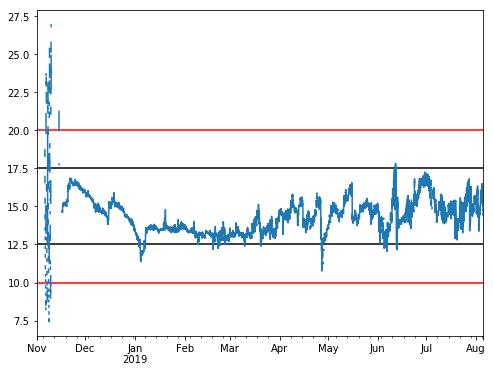

In [11]:
fig, ax = plt.subplots()
fig.set_size_inches(8,6)
df['water_temp'].plot(ax=ax)

ax.hlines(17.5,xmin=df.index[0], xmax=df.index[-1])
ax.hlines(12.5,xmin=df.index[0], xmax=df.index[-1])
ax.hlines(20,xmin=df.index[0], xmax=df.index[-1],color='r')
ax.hlines(10,xmin=df.index[0], xmax=df.index[-1],color='r')

__QARTOD test configuration__

These can be stored as a python dictionary in the file or loaded from a JSON file.

In [13]:
config = {
    'qartod': {
        'gross_range_test': {
            'suspect_span': [12.5, 17.5],
            'fail_span': [10, 20]
        },
        "flat_line_test": {
            "tolerance": 0.01,
            "suspect_threshold": 7200,
            "fail_threshold": 21600
        },
        "rate_of_change_test": {
            "threshold": 0.001
      },
        "spike_test": {
            "suspect_threshold": 0.8,
            "fail_threshold": 3
      }
    }
}


In [15]:
# Add the configuration file to the test object
qc = QcConfig(config)

# Run the test
qc_results =  qc.run(
    inp=df['water_temp'],
    tinp=df['epoch_time']
)

# Aggreate the flags into a single flag
all_tests = [qc_results['qartod'][test_name] for test_name in qc_results['qartod'].keys()]
qc_results['qartod']['qc_agg'] = qartod.qartod_compare(all_tests).astype(int)

In [17]:
#results
title = "Seawater Temp: OA1"

plot_results(df, 'water_temp', qc_results, title, 'gross_range_test')
plot_results(df, 'water_temp', qc_results, title, 'flat_line_test')
plot_results(df, 'water_temp', qc_results, title, 'spike_test')
plot_results(df, 'water_temp', qc_results, title, 'rate_of_change_test')

In [19]:
# Plot the rolled up flags
plot_results(df, 'water_temp', qc_results, title, 'qc_agg')